# Proyecto de datos
## Enfermedades respiratorias en Argentina
### Vigilancia de Infecciones respiratorias agudas 
#### Autor: Rodolfo Pardo 

##### Objetivo: en una empresa de movilidad en cuanto a transporte de pasajeros se busca por pedido de Gerencia y Marketing, un estudio de datos enfocado pura y exclusivamente en el área de salud para saber que necesitan sus automóviles a la hora de afrontar el invierno en Argentina y evitar en colaboración del Ministerio de Salud, transmisión del virus Influenza.


##### Hipotesis planteadas antes del estudio de datos: 

* En temporada invernal, aumentan los casos de infecciones respiratorias argentinas en las provincias. 
* Neumonía, es la infección más popular en los argentinos. 
* Niños e infantes, menores a 2 años son los más afectados por las infecciones respiratorias 

In [84]:
#Instalamos las librerias necesarias que nos van a servir para poder visualizar de mejor medida las variables

import sys 
!{sys.executable} -m pip install plotly==4 cufflinks

  Using cached https://files.pythonhosted.org/packages/58/f3/a49d3281cc7275164ecf89ad3497556b11d9661faa119becdf7f9d3b2125/plotly-4.0.0-py2.py3-none-any.whl
cufflinks 0.16 has requirement plotly<4.0.0a0,>=3.0.0, but you'll have plotly 4.0.0 which is incompatible.
  Found existing installation: plotly 3.0.0
    Uninstalling plotly-3.0.0:
      Successfully uninstalled plotly-3.0.0


In [69]:
#Importando las librerias necesarias

import plotly.plotly as py
import cufflinks as cf
import plotly.tools as tls
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline

In [5]:
#Leemos el archivo para convertirlo en nuestro dataframe

enfermedades = pd.read_csv("vigilancia.csv", low_memory = False)

#### Conociendo nuestros datos

In [6]:
#Los primeros cinco resultados

enfermedades.head()

,departamento_id,departamento_nombre,provincia_id,provincia_nombre,a¤o,semanas_epidemiologicas,evento_nombre,grupo_edad_id,grupo_edad_desc,cantidad_casos
0,1,COMUNA 1,2,CABA,2018,18,Bronquiolitis en menores de 2 a¤os,2,6 a 11 m,2
1,1,COMUNA 1,2,CABA,2018,18,Neumon¡a,5,5 a 9,1
2,1,COMUNA 1,2,CABA,2018,18,Neumon¡a,11,45 a 64,1
3,1,COMUNA 1,2,CABA,2018,19,Bronquiolitis en menores de 2 a¤os,1,< 6 m,1
4,1,COMUNA 1,2,CABA,2018,20,Bronquiolitis en menores de 2 a¤os,1,< 6 m,1


In [7]:
#Los ultimos resultados

enfermedades.tail()

,departamento_id,departamento_nombre,provincia_id,provincia_nombre,a¤o,semanas_epidemiologicas,evento_nombre,grupo_edad_id,grupo_edad_desc,cantidad_casos
65530,91,MAIPé,22,Chaco,2018,18,Neumon¡a,13,>= a 75,2
65531,91,MAIPé,22,Chaco,2018,19,Bronquiolitis en menores de 2 a¤os,1,< 6 m,7
65532,91,MAIPé,22,Chaco,2018,19,Bronquiolitis en menores de 2 a¤os,2,6 a 11 m,5
65533,91,MAIPé,22,Chaco,2018,19,Bronquiolitis en menores de 2 a¤os,3,12 a 23 m,10
65534,91,MAIPé,22,Chaco,2018,19,Enfermedad tipo influenza (ETI),3,12 a 23 m,2


In [8]:
#Cantidad de rows o filas

enfermedades.shape[0]

65535

In [9]:
#Cantidad de columnas 

enfermedades.shape[1]

10

In [10]:
#Nombre de las columnas 

enfermedades.columns

Index(['departamento_id', 'departamento_nombre', 'provincia_id',
       'provincia_nombre', 'a¤o', 'semanas_epidemiologicas', 'evento_nombre',
       'grupo_edad_id', 'grupo_edad_desc', 'cantidad_casos'],
      dtype='object')

In [13]:
#Tipos de datos de cada columna

enfermedades.dtypes

departamento_id             int64
departamento_nombre        object
provincia_id                int64
provincia_nombre           object
a¤o                         int64
semanas_epidemiologicas     int64
evento_nombre              object
grupo_edad_id               int64
grupo_edad_desc            object
cantidad_casos              int64
dtype: object

In [21]:
#Mostrando solo variables cuantitativas 

enfermedades.select_dtypes('int64').head()

,departamento_id,provincia_id,a¤o,semanas_epidemiologicas,grupo_edad_id,cantidad_casos
0,1,2,2018,18,2,2
1,1,2,2018,18,5,1
2,1,2,2018,18,11,1
3,1,2,2018,19,1,1
4,1,2,2018,20,1,1


In [22]:
#Mostrando solo variables cualitativas 

enfermedades.select_dtypes('object').head()

,departamento_nombre,provincia_nombre,evento_nombre,grupo_edad_desc
0,COMUNA 1,CABA,Bronquiolitis en menores de 2 a¤os,6 a 11 m
1,COMUNA 1,CABA,Neumon¡a,5 a 9
2,COMUNA 1,CABA,Neumon¡a,45 a 64
3,COMUNA 1,CABA,Bronquiolitis en menores de 2 a¤os,< 6 m
4,COMUNA 1,CABA,Bronquiolitis en menores de 2 a¤os,< 6 m


In [11]:
#Datos estadisticos que describen nuestro data set

enfermedades.describe()

,departamento_id,provincia_id,a¤o,semanas_epidemiologicas,grupo_edad_id,cantidad_casos
count,65535.000000,65535.000000,65535.0,65535.000000,65535.000000,65535.000000
mean,251.816526,9.670588,2018.0,32.570794,6.716945,6.184955
std,257.458222,5.881082,0.0,8.702216,3.829406,11.200850
min,0.000000,2.000000,2018.0,18.000000,1.000000,0.000000
25%,49.000000,6.000000,2018.0,25.000000,3.000000,1.000000
50%,134.000000,6.000000,2018.0,32.000000,6.000000,3.000000
75%,427.000000,14.000000,2018.0,39.000000,10.000000,6.000000
max,882.000000,22.000000,2018.0,51.000000,17.000000,332.000000


#### Limpieza de datos 

In [24]:
#Comenzamos con el nombre de las columnas, son poco representativos a la muestra 

columnas = ['id_dep', 'departamento', 'id_pro', 'provincia', 'ano', 'semana', 'infeccion', 'edad_id', 'edad', 'n_casos']

In [28]:
#Chequeamos que tenga la misma cantidad de elementos que columnas del dataframe 

if len(columnas) == len(enfermedades.columns):
    print("Ok, puedes cambiarlo")
else:
    print("¡No lo hagas")

Ok, puedes cambiarlo


In [26]:
#Asignando los nuevos nombres a las columnas
enfermedades.columns = columnas

In [27]:
#Mostramos las nuevas columnas
enfermedades.columns

Index(['id_dep', 'departamento', 'id_pro', 'provincia', 'ano', 'semana',
       'infeccion', 'edad_id', 'edad', 'n_casos'],
      dtype='object')

In [44]:
#Es hora de normalizar columnas que por encode no pudimos solucionar en cuanto a nombres
#Vamos a utilizar str.replace para reemplazar strings defectuosos 

enfermedades['departamento'] = enfermedades['departamento'].str.replace("Ö", "I")
enfermedades['departamento'] = enfermedades['departamento'].str.replace("é", "U")
enfermedades['provincia'] = enfermedades['provincia'].str.replace("¢", "o")
enfermedades['infeccion'] = enfermedades['infeccion'].str.replace("¤", "ñ")
enfermedades['infeccion'] = enfermedades['infeccion'].str.replace("¡", "i")

In [47]:
#Ahora, vamos a eliminar las columnas de id ya que preferimos tenerlos en variables categóricas 

enfermedades_df = enfermedades[['departamento', 'provincia', 'ano', 'semana', 'infeccion', 'edad', 'n_casos']]

In [51]:
#Vamos a dar una mirada a nuestro dataframe y lo guardamos en carpeta 

enfermedades_df.head()
enfermedades_df.to_csv('enfermedades_clean.csv')

#### Conociendo los datos del nuevo dataframe 

In [52]:
#Provincias del estudio

enfermedades_df.groupby('provincia').count()

,departamento,ano,semana,infeccion,edad,n_casos
provincia,,,,,,
Buenos Aires,33872,33872,33872,33872,33872,33872
CABA,5587,5587,5587,5587,5587,5587
Catamarca,3990,3990,3990,3990,3990,3990
Chaco,5557,5557,5557,5557,5557,5557
Cordoba,10080,10080,10080,10080,10080,10080
Corrientes,6449,6449,6449,6449,6449,6449


In [53]:
#Infecciones presentes en el estudio 

enfermedades_df.groupby('infeccion').count()

,departamento,provincia,ano,semana,edad,n_casos
infeccion,,,,,,
Bronquiolitis en menores de 2 años,8433,8433,8433,8433,8433,8433
Enfermedad tipo influenza (ETI),39411,39411,39411,39411,39411,39411
Neumonia,17691,17691,17691,17691,17691,17691


In [54]:
#Edades presentes en el estudio 

enfermedades_df.groupby('edad').count()

,departamento,provincia,ano,semana,infeccion,n_casos
edad,,,,,,
10 a 14,4641,4641,4641,4641,4641,4641
12 a 23 m,7013,7013,7013,7013,7013,7013
15 a 19,4450,4450,4450,4450,4450,4450
2 a 4,5430,5430,5430,5430,5430,5430
20 a 24,3924,3924,3924,3924,3924,3924
25 a 34,5148,5148,5148,5148,5148,5148
35 a 44,5203,5203,5203,5203,5203,5203
45 a 64,5837,5837,5837,5837,5837,5837
5 a 9,5265,5265,5265,5265,5265,5265


### Pivot tables para ver estadísticas de nuestros datos

In [65]:
#Estadisticas provincias en pivot tables y guardo

provincias_pt = pd.pivot_table(enfermedades_df,index=['provincia'],
                               values = ['n_casos'], 
                               aggfunc = ['mean', 'std', 'median'])

provincias_pt.to_csv('provincias_pt.csv')
provincias_pt


,mean,std,median
,n_casos,n_casos,n_casos
provincia,,,
Buenos Aires,6.375679,11.089969,3
CABA,6.639341,11.153121,3
Catamarca,8.539348,19.206086,3
Chaco,3.724492,4.617734,2
Cordoba,6.378571,11.183110,3
Corrientes,5.150411,8.311534,3


In [64]:
infecciones_pt = pd.pivot_table(enfermedades_df, index = ['infeccion'],
                               values = ['n_casos'],
                               aggfunc = ['mean', 'std', 'median'])
infecciones_pt.to_csv('infecciones_pt.csv')
infecciones_pt


,mean,std,median
,n_casos,n_casos,n_casos
infeccion,,,
Bronquiolitis en menores de 2 años,11.383019,19.343436,4
Enfermedad tipo influenza (ETI),6.615742,10.574153,3
Neumonia,2.747442,3.495031,2


### Encontrando algún tipo de correlación entre ambos casos 

In [67]:
enfermedades_df['semana'].corr(enfermedades_df['n_casos'])

-0.0544047460499039

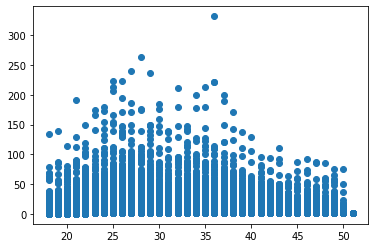

In [70]:
plt.scatter(x = enfermedades_df['semana'], y = enfermedades_df['n_casos'])


### Data Visualization

Vamos a comenzar a visualizar los resultados para aprobar o rechazar hipótesis planteadas en el comienzo del estudio

Primera hipótesis: En temporada invernal, aumentan los casos de infecciones respiratorias argentinas en las provincias

In [75]:
cf.go_offline()
enfermedades_df['semana'].iplot(kind = "box", color = 'blue')

En este gráfico se puede observar como el período de mayor infección se concentran en temporada invernal, entre las semanas 25 (principios de Junio) hasta la semana 39 (finales de septiembre).

<font color=green>PRIMERA HIPOTESIS APROBADA</font>

--------------------------

SEGUNDA HIPÓTESIS: Neumonía, es la infección más popular en los argentinos

In [77]:
enfermedades_df['infeccion'].iplot(kind = "hist", color = 'blue')

Se puede observar cómo la enfermedad tipo influenza ETI es la infección más popular en los argentinos.
Neumonía, ocupa el segundo lugar. 
Aparece, en gran cantidad, la bronquiolitis en menores de dos años. 

<font color=red>SEGUNDA HIPOTESIS RECHAZADA</font>

------

TERCERA HIPÓTESIS: Niños e infantes, menores a 2 años son los más afectados por las infecciones respiratorias

In [81]:
enfermedades_df.iplot(kind='bar', mode='markers', x='edad', y='n_casos', color='skyblue')

* Los infantes menores a 6 meses son los más afectados
* En segundo lugar, los infantes menores a 6 a 11 meses 
* En tercer lugar, los niños de 5 a 9 años 
* En cuarto lugar, los niños de 2 a 4 años 

En cierta parte, son los más afectados, pero también se puede pensar en forma más amplia y abarcar a niños de 2 años en adelante. 


<font color=green>TERCERA HIPOTESIS ACEPTADA</font>

-------

#### Conclusiones del estudio:

* La empresa de movilidad puede iniciar una campaña de concientización sobre la limpieza de manos antes y despúes de viajar en los automóviles de la compañía. Sería de gran utilidad para mejorar la empatía y humanidad de la marca. 
* La empresa tiene que contactarse con todos los choferes y concientizarlos en la limpieza de las unidades con la presencia de desinfectante de manos. 
* La empresa tiene que iniciar todas estas acciones en otoño, principios de mayo para llegar a la zona de más auge con gran exposición mediática. 
* La empresa tiene que apoyar al Ministerio de Salud en cuanto a las campañas de concientización y estar presente en todos los eventos. 
* La empresa tiene que brindar servicios de limpieza en el coche para madres y padres que viajen con niños menores a 5 años e infantes menores a dos años. 